In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm

In [2]:
import matplotlib
import seaborn as sns
from matplotlib import colors
from matplotlib import colors
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.pyplot import rc_context
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors

In [3]:
sc.settings.set_figure_params(dpi=300,fontsize=15)

In [4]:
adata = sc.read_h5ad('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/Endothelial_datasets/data_analyzed/sanger_datasets/adult18_vas_20230622_SNB.h5ad')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [5]:
adata

AnnData object with n_obs × n_vars = 74555 × 31402
    obs: 'id', 'organ', 'donor', 'kit', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'batch', 'study', 'sample', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'doublet_pval', 'Project', 'broad_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'int_or_ext', 'leiden_scVI', 'organ_uni', 'uni_index', 'subsample', 'donor_organ', 'donor_location', 'numbering', 'ann_ec_2', 'scoring_cc_s', 'scoring_cc_m', 'scoring_cc', 'score_s_genes', 'score_g2m_genes', 'score_angio_genes', 'score_EMT_genes', 'score_MET_genes', 'score_stress_genes', 'ann_ec_av', 'ann_ec_size', 'ann_ec_cap', 'ann_ec_final', 'test', 'ann_vas_1', 'published_annotation_skin', 'int_ext', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_vo

In [17]:
adata_subset_2 = adata_subset[adata_subset.obs["ann_vas_broad"].isin(["Mural"])]

In [18]:
adata_subset_2

View of AnnData object with n_obs × n_vars = 1762 × 31402
    obs: 'id', 'organ', 'donor', 'kit', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'batch', 'study', 'sample', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'doublet_pval', 'Project', 'broad_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'int_or_ext', 'leiden_scVI', 'organ_uni', 'uni_index', 'subsample', 'donor_organ', 'donor_location', 'numbering', 'ann_ec_2', 'scoring_cc_s', 'scoring_cc_m', 'scoring_cc', 'score_s_genes', 'score_g2m_genes', 'score_angio_genes', 'score_EMT_genes', 'score_MET_genes', 'score_stress_genes', 'ann_ec_av', 'ann_ec_size', 'ann_ec_cap', 'ann_ec_final', 'test', 'ann_vas_1', 'published_annotation_skin', 'int_ext', 'Cell_category', 'Predicted_labels_CellTypist', 'Majo

In [6]:
adata.obs['ann_merged_final'] = adata.obs['ann_merged_final'].replace('ven_smc_pc','smc_pc_intermediate')

In [7]:
adata.obs.ann_merged_final.value_counts()

myo_cap_ec             11772
art_smc                 8928
ven_ec_1                8445
cap_pc                  6465
cap_ec                  4249
art_ec_2                3700
littoral_ec             3623
pul_cap_ec              2888
ven_ec_2                2697
lec_cap                 1771
endometrium_cap_ec      1741
adip_cap_ec             1671
pericentral_cap_ec      1651
smc_pc_intermediate     1296
pul_ven_ec              1295
large_art_smc           1239
myometrium_cap_ec       1082
aerocyte_ec              972
kidney_cap_ec            971
art_ec_1                 950
remodelling_mural        901
pul_art_ec               735
clec                     696
glomeruli_ec             634
blec                     547
ven_smc                  538
pul_tip_cap_ec           433
spleen_art_ec            406
flec                     376
pul_pc                   320
periportal_cap_ec        297
kidney_art_ec            237
pul_smc                  228
endocardial_ec           203
pfslec        

In [8]:
adata.obs['ann_merged_final'].cat.reorder_categories(['large_art_ec','art_ec_1',"art_ec_2","kidney_art_ec","spleen_art_ec","pul_art_ec","ven_ec_1","ven_ec_2","pul_ven_ec","endocardial_ec","littoral_ec","aerocyte_ec","pul_cap_ec","pul_tip_cap_ec","periportal_cap_ec","pericentral_cap_ec","kidney_cap_ec","glomeruli_ec","cap_ec","endometrium_cap_ec","myometrium_cap_ec","myo_cap_ec","adip_cap_ec",'large_art_smc','art_smc','cap_pc','pul_pc','pul_smc','remodelling_mural','smc_pc_intermediate','ven_smc','lec_cap','blec','clec','flec','pfslec','vlec_down','vlec_up'],inplace=True)

/var/tmp/pbs.9322734.pbs/ipykernel_1212677/1720985812.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['ann_merged_final'].cat.reorder_categories(['large_art_ec','art_ec_1',"art_ec_2","kidney_art_ec","spleen_art_ec","pul_art_ec","ven_ec_1","ven_ec_2","pul_ven_ec","endocardial_ec","littoral_ec","aerocyte_ec","pul_cap_ec","pul_tip_cap_ec","periportal_cap_ec","pericentral_cap_ec","kidney_cap_ec","glomeruli_ec","cap_ec","endometrium_cap_ec","myometrium_cap_ec","myo_cap_ec","adip_cap_ec",'large_art_smc','art_smc','cap_pc','pul_pc','pul_smc','remodelling_mural','smc_pc_intermediate','ven_smc','lec_cap','blec','clec','flec','pfslec','vlec_down','vlec_up'],inplace=True)


/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


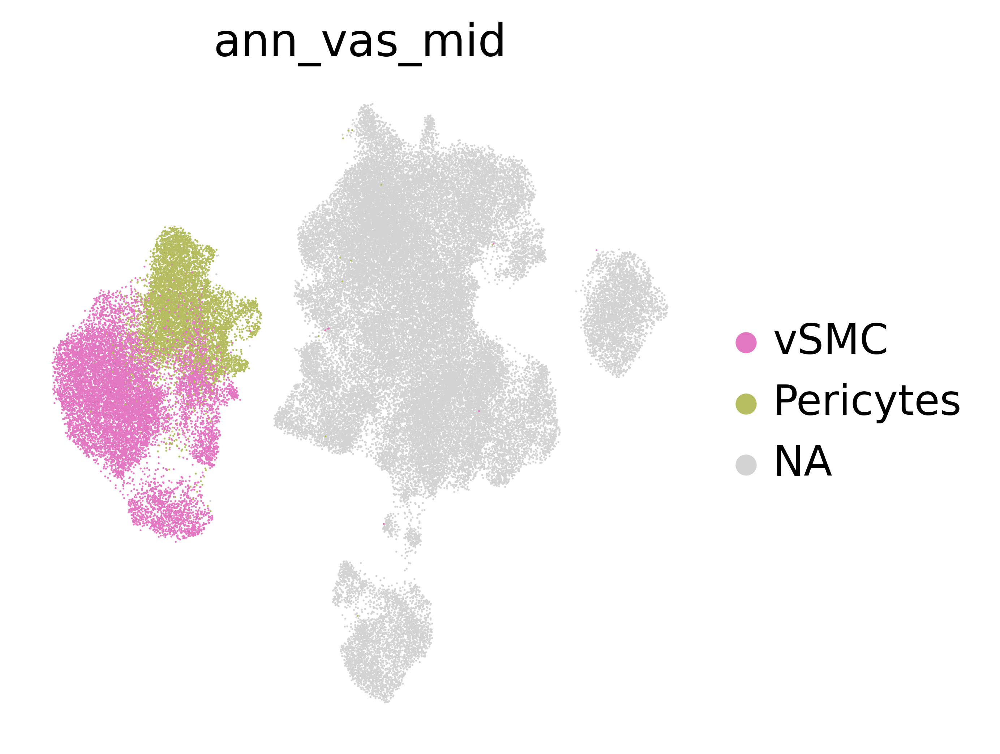

In [7]:
sc.pl.umap(adata, color = 'ann_vas_mid', groups = ["vSMC","Pericytes"], frameon = False)

### Mural

In [9]:
adata_ec = adata[adata.obs["ann_vas_broad"].isin(["Mural"])]

In [10]:
adata_ec

View of AnnData object with n_obs × n_vars = 19915 × 31402
    obs: 'id', 'organ', 'donor', 'kit', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'batch', 'study', 'sample', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'doublet_pval', 'Project', 'broad_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'int_or_ext', 'leiden_scVI', 'organ_uni', 'uni_index', 'subsample', 'donor_organ', 'donor_location', 'numbering', 'ann_ec_2', 'scoring_cc_s', 'scoring_cc_m', 'scoring_cc', 'score_s_genes', 'score_g2m_genes', 'score_angio_genes', 'score_EMT_genes', 'score_MET_genes', 'score_stress_genes', 'ann_ec_av', 'ann_ec_size', 'ann_ec_cap', 'ann_ec_final', 'test', 'ann_vas_1', 'published_annotation_skin', 'int_ext', 'Cell_category', 'Predicted_labels_CellTypist', 'Maj

In [13]:
df = adata.obs[['ann_merged_final','organ_uni']]

In [16]:
count_table = pd.pivot_table(df, index='ann_merged_final', columns='organ_uni', aggfunc=len, fill_value=0)
count_table#.to_csv("")
# contingency_table = pd.crosstab(df['A'], df['B'])

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
large_art_ec,0,0,0,2,0,0,109,0,14,0,0,0,0,1,2,1,1,0
art_ec_1,9,9,0,189,19,125,18,28,15,28,35,49,24,253,20,76,18,35
art_ec_2,159,14,6,1788,85,58,76,18,30,185,516,49,17,114,221,238,79,47
kidney_art_ec,0,0,1,3,193,0,1,0,6,1,2,18,2,0,6,1,0,3
spleen_art_ec,0,0,0,0,1,0,0,0,1,0,0,0,0,0,404,0,0,0
pul_art_ec,0,0,0,9,4,1,1,6,689,1,0,2,0,2,7,0,8,5
ven_ec_1,103,136,37,825,47,343,481,8,997,1244,175,922,106,680,4,883,989,465
ven_ec_2,540,1,0,29,0,1,2,0,3,5,2092,5,0,0,0,9,9,1
pul_ven_ec,0,5,0,85,26,1,5,81,1018,9,2,7,5,3,0,41,5,2


In [17]:
from scipy.stats import chi2_contingency
chi2, p_value, dof, expected = chi2_contingency(count_table)

enrichment_table = pd.DataFrame(count_table.values / expected, index=count_table.index, columns=count_table.columns)

# print(f"Chi-square test statistic: {chi2:.4f}")
# print(f"P-value: {p_value:.4f}")
# print(f"Degrees of freedom: {dof}")
# print("Expected frequencies:")
# print(expected)
enrichment_table

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
large_art_ec,0.000000,0.000000,0.000000,0.067455,0.000000,0.000000,24.757030,0.000000,0.887477,0.000000,0.000000,0.000000,0.000000,0.292155,0.245768,0.191934,0.269122,0.000000
art_ec_1,0.258060,0.668222,0.000000,0.872296,0.790615,7.975503,0.559454,1.013098,0.130119,0.468731,0.293301,2.760566,1.076283,10.114709,0.336314,1.996118,0.662891,0.609173
art_ec_2,1.170570,0.266887,0.035084,2.118807,0.908139,0.950163,0.606495,0.167220,0.066818,0.795169,1.110240,0.708794,0.195743,1.170199,0.954178,1.604987,0.746997,0.210035
kidney_art_ec,0.000000,0.000000,0.091288,0.055501,32.191710,0.000000,0.124585,0.000000,0.208629,0.067103,0.067182,4.064900,0.359518,0.000000,0.404429,0.105280,0.000000,0.209300
spleen_art_ec,0.000000,0.000000,0.000000,0.000000,0.097366,0.000000,0.000000,0.000000,0.020298,0.000000,0.000000,0.000000,0.000000,0.000000,15.896236,0.000000,0.000000,0.000000
pul_art_ec,0.000000,0.000000,0.000000,0.053688,0.215133,0.082468,0.040172,0.280596,7.725099,0.021637,0.000000,0.145636,0.000000,0.103347,0.152142,0.000000,0.380799,0.112481
ven_ec_1,0.332231,1.135902,0.094790,0.428331,0.220005,2.461876,1.681748,0.032562,0.972899,2.342663,0.164971,5.843283,0.534743,3.058199,0.007567,2.608899,4.097226,0.910437
ven_ec_2,5.453996,0.026153,0.000000,0.047146,0.000000,0.022475,0.021896,0.000000,0.009167,0.029483,6.175181,0.099224,0.000000,0.000000,0.000000,0.083264,0.116749,0.006131
pul_ven_ec,0.000000,0.272334,0.000000,0.287789,0.793668,0.046806,0.114003,2.149970,6.478138,0.110525,0.012295,0.289304,0.164490,0.087985,0.000000,0.789969,0.135081,0.025536


In [18]:
log1p_enrichment_table = np.log1p(enrichment_table)
log1p_enrichment_table

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
large_art_ec,0.000000,0.000000,0.000000,0.065277,0.000000,0.000000,3.248708,0.000000,0.635241,0.000000,0.000000,0.000000,0.000000,0.256311,0.219752,0.175578,0.238326,0.000000
art_ec_1,0.229571,0.511758,0.000000,0.627165,0.582559,2.194499,0.444336,0.699675,0.122323,0.384399,0.257198,1.324569,0.730579,2.408269,0.289915,1.097317,0.508558,0.475721
art_ec_2,0.774990,0.236563,0.034483,1.137451,0.646128,0.667913,0.474055,0.154625,0.064680,0.585099,0.746802,0.535788,0.178768,0.774819,0.669970,0.957428,0.557898,0.190650
kidney_art_ec,0.000000,0.000000,0.087359,0.054015,3.502300,0.000000,0.117414,0.000000,0.189487,0.064947,0.065021,1.622334,0.307130,0.000000,0.339631,0.100099,0.000000,0.190042
spleen_art_ec,0.000000,0.000000,0.000000,0.000000,0.092913,0.000000,0.000000,0.000000,0.020094,0.000000,0.000000,0.000000,0.000000,0.000000,2.827091,0.000000,0.000000,0.000000
pul_art_ec,0.000000,0.000000,0.000000,0.052297,0.194854,0.079243,0.039386,0.247325,2.166204,0.021406,0.000000,0.135960,0.000000,0.098349,0.141623,0.000000,0.322662,0.106593
ven_ec_1,0.286855,0.758889,0.090563,0.356507,0.198855,1.241811,0.986469,0.032043,0.679504,1.206768,0.152696,1.923268,0.428363,1.400739,0.007538,1.283403,1.628697,0.647332
ven_ec_2,1.864699,0.025817,0.000000,0.046068,0.000000,0.022226,0.021660,0.000000,0.009125,0.029057,1.970628,0.094604,0.000000,0.000000,0.000000,0.079979,0.110422,0.006112
pul_ven_ec,0.000000,0.240853,0.000000,0.252927,0.584262,0.045744,0.107960,1.147393,2.011984,0.104833,0.012220,0.254102,0.152283,0.084327,0.000000,0.582199,0.126704,0.025216


In [33]:
df2 = log1p_enrichment_table.loc[['large_art_smc','art_smc','cap_pc','pul_pc','pul_smc','remodelling_mural','smc_pc_intermediate','ven_smc',]]

In [34]:
df2

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
large_art_smc,0.000000,0.107829,0.067516,0.061752,0.031407,0.000000,3.372267,0.0,0.113080,0.012754,0.000000,0.000000,0.000000,0.000000,0.037951,0.058661,0.027846,0.089307
art_smc,0.771240,1.748874,0.061101,0.527049,0.256369,0.921870,0.450336,0.0,0.110022,0.306042,1.334274,0.280444,0.116954,0.932150,0.182657,0.838774,0.809212,1.192857
cap_pc,0.592760,0.392075,1.564067,0.922850,0.087753,0.171862,0.216771,0.0,0.319205,0.139810,0.807036,0.032578,0.575260,0.028951,0.667244,0.351137,0.321222,1.046114
pul_pc,0.000000,0.000000,0.065423,0.013609,0.116479,0.000000,0.000000,0.0,2.201087,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.229805
pul_smc,0.000000,0.656528,0.173771,0.074107,0.000000,0.000000,0.230323,0.0,2.120734,0.443411,0.130736,0.000000,0.171307,0.000000,0.000000,0.000000,0.142755,0.000000
remodelling_mural,0.058708,0.145458,2.920637,0.065908,0.042939,0.065108,0.123177,0.0,0.190923,0.262413,0.108733,0.000000,0.046200,0.155818,0.235825,0.404448,0.177435,0.651062
smc_pc_intermediate,0.768257,1.920366,0.249821,0.417144,0.059216,0.171496,2.032068,0.0,0.363774,0.348696,0.541570,0.646338,0.332515,0.028884,0.012251,1.546821,1.552942,0.709719
ven_smc,0.049391,0.000000,0.278929,0.225255,0.199205,0.291172,1.444106,0.0,0.496730,2.027084,0.029165,0.334990,0.000000,0.132072,0.029261,1.988892,0.418866,0.379124


In [35]:
df3 = df2.transpose()
df3

ann_merged_final,large_art_smc,art_smc,cap_pc,pul_pc,pul_smc,remodelling_mural,smc_pc_intermediate,ven_smc
organ_uni,,,,,,,,
adipose_tissue,0.000000,0.771240,0.592760,0.000000,0.000000,0.058708,0.768257,0.049391
bladder,0.107829,1.748874,0.392075,0.000000,0.656528,0.145458,1.920366,0.000000
decidua,0.067516,0.061101,1.564067,0.065423,0.173771,2.920637,0.249821,0.278929
heart,0.061752,0.527049,0.922850,0.013609,0.074107,0.065908,0.417144,0.225255
kidney,0.031407,0.256369,0.087753,0.116479,0.000000,0.042939,0.059216,0.199205
large_intestine,0.000000,0.921870,0.171862,0.000000,0.000000,0.065108,0.171496,0.291172
large_vessels,3.372267,0.450336,0.216771,0.000000,0.230323,0.123177,2.032068,1.444106
liver,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
lung,0.113080,0.110022,0.319205,2.201087,2.120734,0.190923,0.363774,0.496730


/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


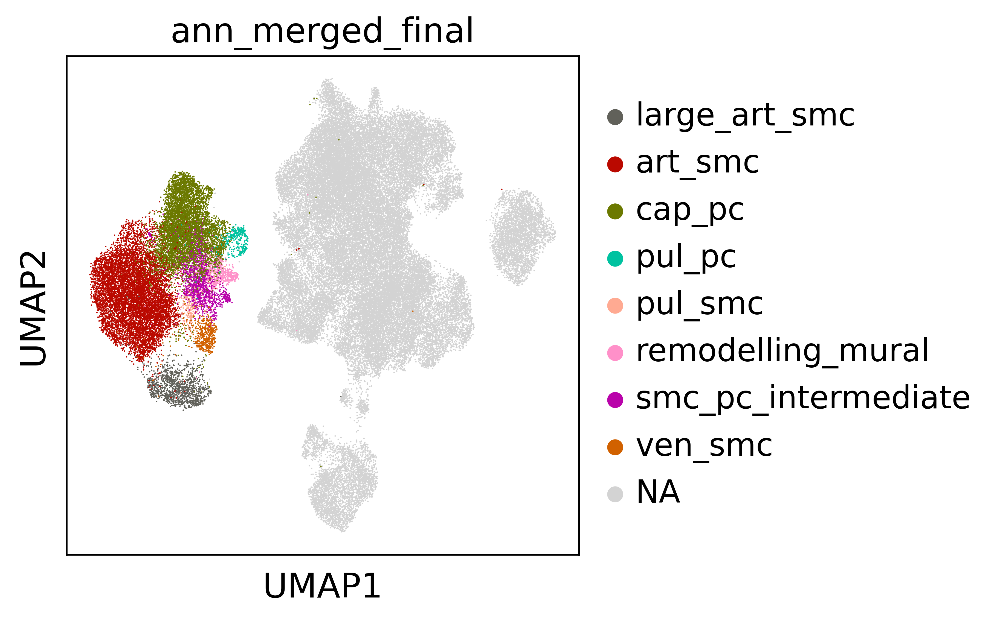

In [38]:
sc.pl.umap(adata, color = "ann_merged_final", groups = ['large_art_smc','art_smc','cap_pc','pul_pc','pul_smc','remodelling_mural','ven_smc','smc_pc_intermediate'])

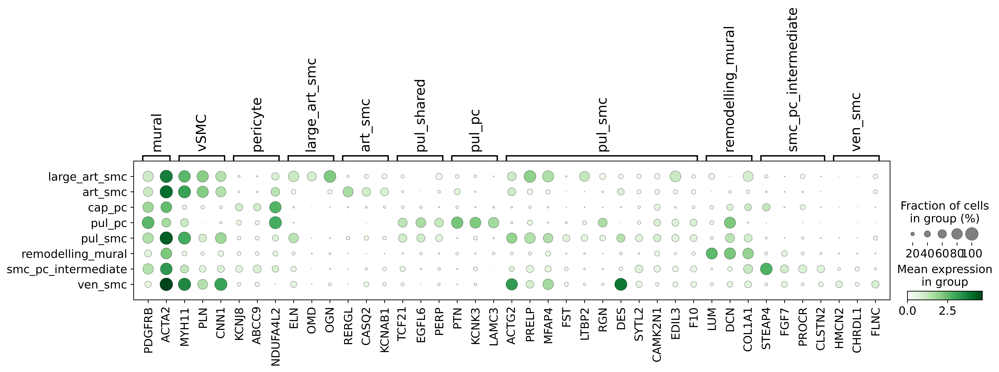

In [11]:
# sc.pl.umap(adata, color = "ann_merged_final", groups = ["aerocyte_ec","pul_cap_ec","pul_tip_cap_ec","periportal_cap_ec","pericentral_cap_ec","kidney_cap_ec","glomeruli_ec","cap_ec","endometrium_cap_ec","myometrium_cap_ec","myo_cap_ec","adip_cap_ec"])

mural_markers = {
    'mural': ["PDGFRB","ACTA2"],
    'vSMC': ["MYH11","PLN","CNN1"],
    'pericyte': ["KCNJ8","ABCC9","NDUFA4L2"],
    'large_art_smc': ["ELN","OMD","OGN"],
    'art_smc': ["RERGL","CASQ2","KCNAB1"],
    'pul_shared': ["TCF21","EGFL6","PERP"],
    'pul_pc': ["PTN","KCNK3","LAMC3"],
    'pul_smc': ["ACTG2","PRELP","MFAP4","FST","LTBP2","RGN","DES","SYTL2","CAMK2N1","EDIL3","F10"],
    'remodelling_mural': ["LUM","DCN","COL1A1"],
    'smc_pc_intermediate': ["STEAP4","FGF7","PROCR","CLSTN2"],
    'ven_smc': ["HMCN2","CHRDL1","FLNC"],
}

sc.pl.dotplot(adata_ec, mural_markers, "ann_merged_final", swap_axes = False, color_map = 'Greens')

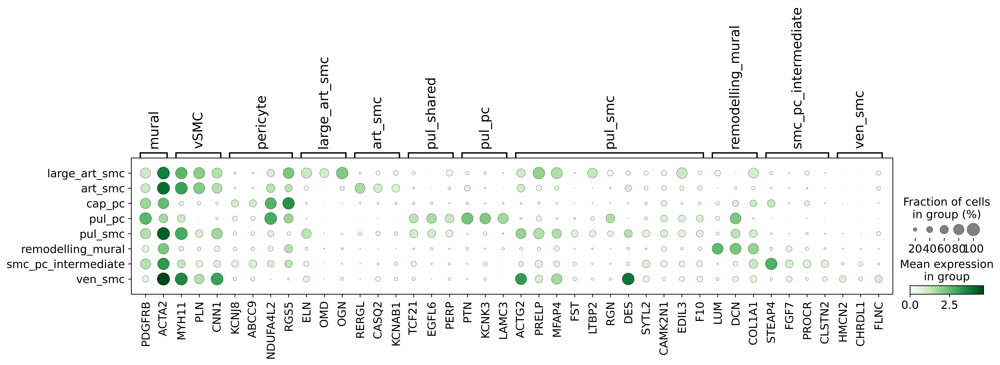

In [26]:
# sc.pl.umap(adata, color = "ann_merged_final", groups = ["aerocyte_ec","pul_cap_ec","pul_tip_cap_ec","periportal_cap_ec","pericentral_cap_ec","kidney_cap_ec","glomeruli_ec","cap_ec","endometrium_cap_ec","myometrium_cap_ec","myo_cap_ec","adip_cap_ec"])

mural_markers = {
    'mural': ["PDGFRB","ACTA2"],
    'vSMC': ["MYH11","PLN","CNN1"],
    'pericyte': ["KCNJ8","ABCC9","NDUFA4L2","RGS5"],
    'large_art_smc': ["ELN","OMD","OGN"],
    'art_smc': ["RERGL","CASQ2","KCNAB1"],
    'pul_shared': ["TCF21","EGFL6","PERP"],
    'pul_pc': ["PTN","KCNK3","LAMC3"],
    'pul_smc': ["ACTG2","PRELP","MFAP4","FST","LTBP2","RGN","DES","SYTL2","CAMK2N1","EDIL3","F10"],
    'remodelling_mural': ["LUM","DCN","COL1A1"],
    'smc_pc_intermediate': ["STEAP4","FGF7","PROCR","CLSTN2"],
    'ven_smc': ["HMCN2","CHRDL1","FLNC"],
}

sc.pl.dotplot(adata_ec, mural_markers, "ann_merged_final", swap_axes = False, color_map = 'Greens')

In [24]:
df6 = log1p_enrichment_table.loc[['large_art_smc','art_smc','cap_pc','pul_pc','pul_smc','remodelling_mural','ven_smc','smc_pc_intermediate']]

In [25]:
df6

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
large_art_smc,0.000000,0.107829,0.067516,0.061752,0.031407,0.000000,3.372267,0.0,0.113080,0.012754,0.000000,0.000000,0.000000,0.000000,0.037951,0.058661,0.027846,0.089307
art_smc,0.771240,1.748874,0.061101,0.527049,0.256369,0.921870,0.450336,0.0,0.110022,0.306042,1.334274,0.280444,0.116954,0.932150,0.182657,0.838774,0.809212,1.192857
cap_pc,0.592760,0.392075,1.564067,0.922850,0.087753,0.171862,0.216771,0.0,0.319205,0.139810,0.807036,0.032578,0.575260,0.028951,0.667244,0.351137,0.321222,1.046114
pul_pc,0.000000,0.000000,0.065423,0.013609,0.116479,0.000000,0.000000,0.0,2.201087,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.229805
pul_smc,0.000000,0.656528,0.173771,0.074107,0.000000,0.000000,0.230323,0.0,2.120734,0.443411,0.130736,0.000000,0.171307,0.000000,0.000000,0.000000,0.142755,0.000000
remodelling_mural,0.058708,0.145458,2.920637,0.065908,0.042939,0.065108,0.123177,0.0,0.190923,0.262413,0.108733,0.000000,0.046200,0.155818,0.235825,0.404448,0.177435,0.651062
ven_smc,0.049391,0.000000,0.278929,0.225255,0.199205,0.291172,1.444106,0.0,0.496730,2.027084,0.029165,0.334990,0.000000,0.132072,0.029261,1.988892,0.418866,0.379124
smc_pc_intermediate,0.768257,1.920366,0.249821,0.417144,0.059216,0.171496,2.032068,0.0,0.363774,0.348696,0.541570,0.646338,0.332515,0.028884,0.012251,1.546821,1.552942,0.709719


In [26]:
df7 = df6.transpose()
df7

ann_merged_final,large_art_smc,art_smc,cap_pc,pul_pc,pul_smc,remodelling_mural,ven_smc,smc_pc_intermediate
organ_uni,,,,,,,,
adipose_tissue,0.000000,0.771240,0.592760,0.000000,0.000000,0.058708,0.049391,0.768257
bladder,0.107829,1.748874,0.392075,0.000000,0.656528,0.145458,0.000000,1.920366
decidua,0.067516,0.061101,1.564067,0.065423,0.173771,2.920637,0.278929,0.249821
heart,0.061752,0.527049,0.922850,0.013609,0.074107,0.065908,0.225255,0.417144
kidney,0.031407,0.256369,0.087753,0.116479,0.000000,0.042939,0.199205,0.059216
large_intestine,0.000000,0.921870,0.171862,0.000000,0.000000,0.065108,0.291172,0.171496
large_vessels,3.372267,0.450336,0.216771,0.000000,0.230323,0.123177,1.444106,2.032068
liver,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
lung,0.113080,0.110022,0.319205,2.201087,2.120734,0.190923,0.496730,0.363774


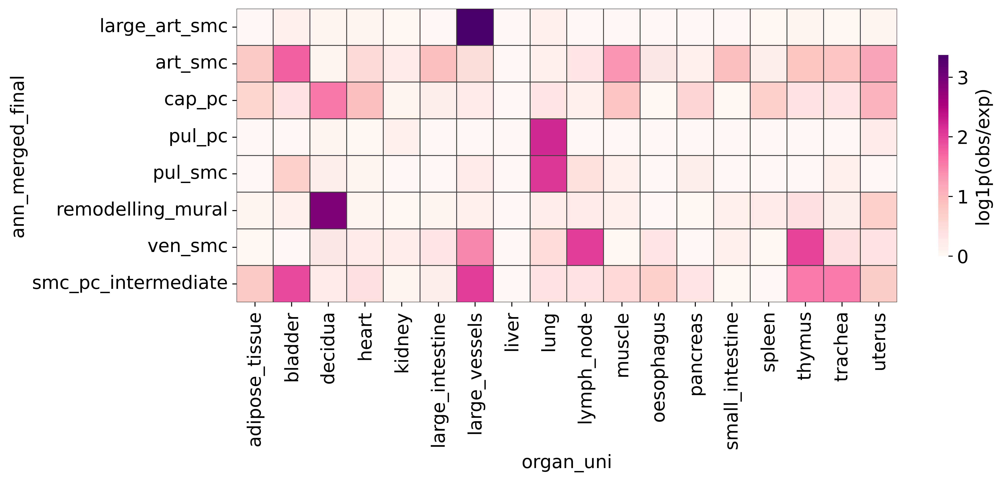

In [27]:
#organotypic art ec

from matplotlib.colors import ListedColormap

with rc_context({'figure.figsize': (12,12)}):
    sns.heatmap(df6,
                annot=False, fmt='g',
                square = True,
                cmap = 'RdPu',
                linewidths=0.5, linecolor='#424242',
                cbar_kws={"orientation": "vertical", "label": "log1p(obs/exp)", "shrink": 0.25})
    
    #plt.tick_params(axis='x', which='both', top=False, bottom=False, labeltop=False, labelbottom=False)
    ax = plt.gca()
    ax.spines['top'].set_linewidth(2)
    ax.spines['top'].set_edgecolor('black')
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['bottom'].set_edgecolor('black')
    ax.spines['left'].set_linewidth(2)
    ax.spines['left'].set_edgecolor('black')
    ax.spines['right'].set_linewidth(2)
    ax.spines['right'].set_edgecolor('black')
    #ax.set_xticklabels([])
    
    plt.show()
    #plt.savefig('./figures/enrichment_ec_av_enrichment.png')

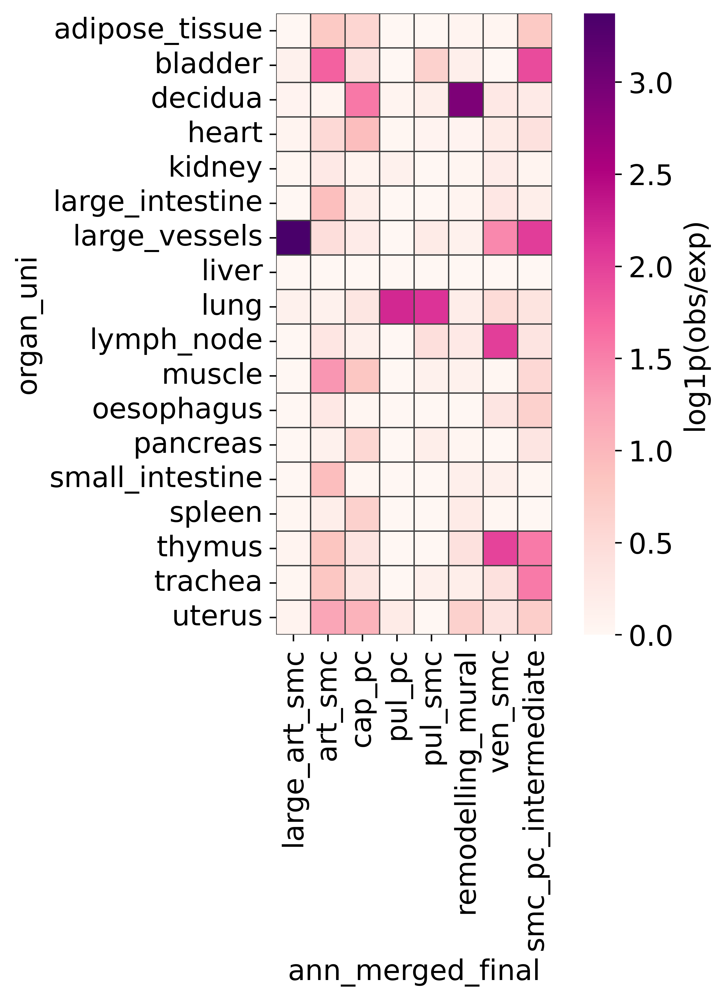

In [28]:
#organotypic art ec

from matplotlib.colors import ListedColormap

with rc_context({'figure.figsize': (6,6)}):
    sns.heatmap(df7,
                annot=False, fmt='g',
                square = True,
                cmap = 'RdPu',
                linewidths=0.5, linecolor='#424242',
                cbar_kws={"orientation": "vertical", "label": "log1p(obs/exp)", "shrink": 1})
    

    #plt.tick_params(axis='x', which='both', top=False, bottom=False, labeltop=False, labelbottom=False)
    ax = plt.gca()
    ax.spines['top'].set_linewidth(2)
    ax.spines['top'].set_edgecolor('black')
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['bottom'].set_edgecolor('black')
    ax.spines['left'].set_linewidth(2)
    ax.spines['left'].set_edgecolor('black')
    ax.spines['right'].set_linewidth(2)
    ax.spines['right'].set_edgecolor('black')
    #ax.set_xticklabels([])
    
    plt.show()
    #plt.savefig('./figures/enrichment_ec_av_enrichment.png')

In [13]:
import pandas as pd

import numpy as np

import scanpy as sc

import matplotlib.patches as ptc

import matplotlib.pyplot as plt
 
from matplotlib import cm

from matplotlib.colors import ListedColormap, LinearSegmentedColormap

from matplotlib.axis import Tick

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [18]:
adata = adata_ec

In [19]:
x=adata.X.todense()

In [20]:
matrix=pd.DataFrame(x,columns=adata.var.index,index=adata.obs.index)

In [21]:
def gene_coloc_2(adata,Gene1="INHBA",Gene2="NRG1",Gene3="SMOC1",groupby=None,threshold=0.1,mode=("plot","table"),color1="Reds",color2="Greens",color3="Blues",plot_only_coloc=False,alpha=1,size=0.3,fontsize=8,label_width="25%",label_height="2.5%"):

    import warnings

    warnings.filterwarnings("ignore")

    from datetime import datetime

    now = datetime.now()

    current_time = now.strftime("%H:%M:%S")

    print("Start Time =", current_time)

    warnings.filterwarnings("ignore")   

    def plot_coloc():

        df=pd.DataFrame(adata.obsm["X_umap"],columns=["x","y"],index=adata.obs.index)

        df["x1"]=df["x"]

        df["y1"]=df["y"]

        df["x2"]=df["x"]

        df["y2"]=df["y"]

        df["x3"]=df["x"]

        df["y3"]=df["y"]

        df["x4"]=df["x"]

        df["y4"]=df["y"]

        df["x5"]=df["x"]

        df["y5"]=df["y"]

        matrix["Gene1"]=matrix[Gene1]

        matrix["Gene2"]=matrix[Gene2]

        matrix["Gene3"]=matrix[Gene3]

        coloc=(matrix["Gene1"]+matrix["Gene2"]+matrix["Gene3"])/3

        df.x1[matrix.Gene1<threshold]="NA"

        df.y1[matrix.Gene1<threshold]="NA"

        df.x1[matrix.Gene2>=threshold]="NA"

        df.y1[matrix.Gene2>=threshold]="NA"

        df.x1[matrix.Gene3>=threshold]="NA"

        df.y1[matrix.Gene3>=threshold]="NA"

        df.x2[matrix.Gene2<threshold]="NA"

        df.y2[matrix.Gene2<threshold]="NA"

        df.x2[matrix.Gene1>=threshold]="NA"

        df.y2[matrix.Gene1>=threshold]="NA"

        df.x2[matrix.Gene3>=threshold]="NA"

        df.y2[matrix.Gene3>=threshold]="NA"


        df.x3[matrix.Gene1>=threshold]="NA"

        df.y3[matrix.Gene1>=threshold]="NA"

        df.x3[matrix.Gene2>=threshold]="NA"

        df.y3[matrix.Gene2>=threshold]="NA"

        df.x3[matrix.Gene3>=threshold]="NA"

        df.y3[matrix.Gene3>=threshold]="NA"        

        df.x4[matrix.Gene1<threshold]="NA"

        df.y4[matrix.Gene1<threshold]="NA"

        df.x4[matrix.Gene2<threshold]="NA"

        df.y4[matrix.Gene2<threshold]="NA"

        df.x4[matrix.Gene3<threshold]="NA"

        df.y4[matrix.Gene3<threshold]="NA"

        df.x5[matrix.Gene3<threshold]="NA"

        df.y5[matrix.Gene3<threshold]="NA"

        df.x5[matrix.Gene1>=threshold]="NA"

        df.y5[matrix.Gene1>=threshold]="NA"

        df.x5[matrix.Gene2>=threshold]="NA"

        df.y5[matrix.Gene2>=threshold]="NA"

        df.x1=df.x1.replace("NA",np.NaN)

        df.y1=df.y1.replace("NA",np.NaN)

        df.x2=df.x2.replace("NA",np.NaN)

        df.y2=df.y2.replace("NA",np.NaN)

        df.x3=df.x3.replace("NA",np.NaN)

        df.y3=df.y3.replace("NA",np.NaN)

        df.x4=df.x4.replace("NA",np.NaN)

        df.y4=df.y4.replace("NA",np.NaN)

        df.x5=df.x5.replace("NA",np.NaN)

        df.y5=df.y5.replace("NA",np.NaN)

        per_exp=df.x4.count()*100/(df.x1.count()+df.x2.count()+df.x4.count()+df.x5.count())

        per_total=df.x4.count()*100/(df.x1.count()+df.x2.count()+df.x4.count()+df.x3.count()+df.x5.count())

        per_gene1=df.x4.count()*100/(df.x1.count()+df.x4.count())

        per_gene2=df.x4.count()*100/(df.x2.count()+df.x4.count())

        per_gene3=df.x4.count()*100/(df.x5.count()+df.x4.count())

        c1Big = cm.get_cmap(color1, 512)

        c1 = ListedColormap(c1Big(np.linspace(0.3, 1.0, 256)))

        c2Big = cm.get_cmap(color2, 512)

        c2 = ListedColormap(c2Big(np.linspace(0.3, 1.0, 256)))

        c3Big = cm.get_cmap(color3, 512)

        c3 = ListedColormap(c3Big(np.linspace(0.3, 1.0, 256)))

        fig, ax = plt.subplots()

        plt.xlabel("UMAP1")

        plt.ylabel("UMAP2")

        plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False,labelleft=False)

        ax.scatter(df.x3,df.y3,s=size,c="lightgrey",alpha=1,marker="o",edgecolors="none")

        ax.set_title(Gene1 +"/" + Gene2 + "/" + Gene3 +" Co-localisation")

        if plot_only_coloc==True:

            im=ax.scatter(df.x1,df.y1,s=size,c="lightgrey",alpha=1,marker="o",edgecolors="none")

            im2=ax.scatter(df.x2,df.y2,s=size,c="lightgrey",alpha=1,marker="o",edgecolors="none")   

        if plot_only_coloc==False:

            im=ax.scatter(df.x1,df.y1,s=size,c=matrix[Gene1],cmap=c1,alpha=alpha,marker="o",edgecolors="none")

            im2=ax.scatter(df.x2,df.y2,s=size,c=matrix[Gene2],cmap=c2,alpha=alpha,marker="o",edgecolors="none")

        im3=ax.scatter(df.x4,df.y4,s=size,c=coloc,cmap=c3,alpha=alpha,marker="o",edgecolors="none")

        ax.grid(False)

        ax.set_xticks([])

        ax.set_yticks([])
 


        if plot_only_coloc==False:

            axins = inset_axes(ax,

                       width=label_width,  # width = 5% of parent_bbox width

                       height=label_height,  # height : 50%

                       loc='lower left',

                       bbox_to_anchor=(1.05, 0, 1, 1),

                       bbox_transform=ax.transAxes,

                       borderpad=0,

                       )

            axins2 = inset_axes(ax,

                       width=label_width,  # width = 5% of parent_bbox width

                       height=label_height,  # height : 50%

                       loc='lower left',

                       bbox_to_anchor=(1.05, 0.15, 1, 1),

                       bbox_transform=ax.transAxes,

                       borderpad=0,

                       )

            axins3 = inset_axes(ax,

                       width=label_width,  # width = 5% of parent_bbox width

                       height=label_height,  # height : 50%

                       loc='lower left',

                       bbox_to_anchor=(1.05, 0.3, 1, 1),

                       bbox_transform=ax.transAxes,

                       borderpad=0,

                       )

            cb1=fig.colorbar(im, cax=axins,orientation='horizontal',shrink=0.3)

            cb2=fig.colorbar(im2, cax=axins2,orientation='horizontal',shrink=0.3)

            cb1.ax.set_title(label=Gene1,y=0.6,fontsize=fontsize)

            cb2.ax.set_title(label=Gene2,y=0.6,fontsize=fontsize)

            cb1.ax.tick_params(labelsize=fontsize)

            cb2.ax.tick_params(labelsize=fontsize)

        if plot_only_coloc==True:

            axins3 = inset_axes(ax,

                       width=label_width,  # width = 5% of parent_bbox width

                       height=label_height,  # height : 50%

                       loc='lower left',

                       bbox_to_anchor=(1.05, 0, 1, 1),

                       bbox_transform=ax.transAxes,

                       borderpad=0,

                       )
 
        textstr1=(str("%.2f" % per_total)+"% of Total")

        textstr2=(str("%.2f" % per_exp)+"% of Expressed")

        textstr3=(str("%.2f" % per_gene1)+"% of "+Gene1)

        textstr4=(str("%.2f" % per_gene2)+"% of "+Gene2)

        textstr5=(str("%.2f" % per_gene3)+"% of "+Gene3)

        plt.text(1.0, 0.87, textstr1, fontsize=fontsize, transform=plt.gcf().transFigure)

        plt.text(1.0, 0.82, textstr2, fontsize=fontsize, transform=plt.gcf().transFigure)

        plt.text(1.0, 0.77, textstr3, fontsize=fontsize, transform=plt.gcf().transFigure)

        plt.text(1.0, 0.72, textstr4, fontsize=fontsize, transform=plt.gcf().transFigure)

        plt.text(1.0, 0.67, textstr5, fontsize=fontsize, transform=plt.gcf().transFigure)

        cb3=fig.colorbar(im3, cax=axins3,orientation='horizontal',shrink=0.3)

        cb3.ax.set_title(label="Mean Co-loc",y=0.6,fontsize=fontsize)

        cb3.ax.tick_params(labelsize=fontsize)

        del matrix["Gene1"]

        del matrix["Gene2"]

    def coloc_table(adata=adata,Gene1=Gene1,Gene2=Gene2,threshold=threshold):

            df=pd.DataFrame(adata.obsm["X_umap"],columns=["x","y"],index=adata.obs.index)

            df["x1"]=df["x"]

            df["x2"]=df["x"]

            df["x3"]=df["x"]

            df["x4"]=df["x"]

            matrix["Gene1"]=matrix[Gene1]

            matrix["Gene2"]=matrix[Gene2]

            coloc=(matrix["Gene1"]+matrix["Gene2"])/2

            df.x1[matrix.Gene1<threshold]="NA"

            df.x1[matrix.Gene2>=threshold]="NA"

            df.x2[matrix.Gene2<threshold]="NA"

            df.x2[matrix.Gene1>=threshold]="NA"

            df.x3[matrix.Gene1>=threshold]="NA"

            df.x3[matrix.Gene2>=threshold]="NA"         

            df.x4[matrix.Gene1<threshold]="NA"

            df.x4[matrix.Gene2<threshold]="NA"

            df.x1=df.x1.replace("NA",np.NaN)

            df.x2=df.x2.replace("NA",np.NaN)

            df.x3=df.x3.replace("NA",np.NaN)

            df.x4=df.x4.replace("NA",np.NaN)

            per_exp=df.x4.count()*100/(df.x1.count()+df.x2.count()+df.x4.count())

            per_total=df.x4.count()*100/(df.x1.count()+df.x2.count()+df.x4.count()+df.x3.count())

            per_gene1=df.x4.count()*100/(df.x1.count()+df.x4.count())

            per_gene2=df.x4.count()*100/(df.x2.count()+df.x4.count())

            name=Gene1+"_"+Gene2

            data={"Pair":name,

                  "Gene1":Gene1,

                  "Gene2":Gene2,

                  "Percentage_All":per_total,

                  "Percentage_Expressing":per_exp,

                  "Percentage_of_Gene1":per_gene1,

                  "Percentage_of_Gene2":per_gene2,

                  "Total_Cells":(df.x1.count()+df.x2.count()+df.x4.count()+df.x3.count()),

                  "Expressing_Cells":(df.x1.count()+df.x2.count()+df.x4.count()),

                  "Gene1_Cells":(df.x1.count()+df.x4.count()),

                  "Gene2_Cells":(df.x2.count()+df.x4.count())}

            del matrix["Gene1"]

            del matrix["Gene2"]

            return data
 
    if mode=="table":

        groups=[]

        pair=[]

        gene1=[]

        gene2=[]

        perall=[]

        perexp=[]

        perg1=[]

        perg2=[]

        tcells=[]

        expcells=[]

        g1cells=[]

        g2cells=[]

        if groupby!=None:

            group=set(list(adata.obs[groupby]))

            grouplist=[]

            for m in group:

                sub=adata[adata.obs[groupby]==m]

                for i,j in [(i,j) for i in Gene1 for j in Gene2]:

                    if (i!=j) and (f"{j}_{i}" not in groups):

                        x = coloc_table(sub,Gene1=i,Gene2=j)

                        grouplist=np.append(grouplist,m)

                        pair=np.append(pair,x["Pair"])

                        gene1=np.append(gene1,x["Gene1"])

                        gene2=np.append(gene2,x["Gene2"])

                        perall=np.append(perall,x["Percentage_All"])

                        perexp=np.append(perexp,x["Percentage_Expressing"])

                        perg1=np.append(perg1,x["Percentage_of_Gene1"])

                        perg2=np.append(perg2,x["Percentage_of_Gene2"])

                        tcells=np.append(tcells,x["Total_Cells"])

                        expcells=np.append(expcells,x["Expressing_Cells"])

                        g1cells=np.append(g1cells,x["Gene1_Cells"])

                        g2cells=np.append(g2cells,x["Gene2_Cells"])    

                        groups.append(f"{i}_{j}")

            d=pd.DataFrame({

                    "Pair":pair,

                    "Gene1":gene1,

                    "Gene2":gene2,

                    "%_of_All":perall,

                    "%_of_Expressing":perexp,

                    "%_of_Gene1":perg1,

                    "%_of_Gene2":perg2,

                    "Total_Cells":tcells,

                    "Expressing_Cells":expcells,

                    "Gene1_Cells":g1cells,

                    "Gene2_Cells":g2cells,

                    groupby:grouplist})         

            d.reset_index(drop=True, inplace=True)

        else:

            for i,j in [(i,j) for i in Gene1 for j in Gene2]:

                if (i!=j) and (f"{j}_{i}" not in groups):

                    x = coloc_table(Gene1=i,Gene2=j)

                    pair=np.append(pair,x["Pair"])

                    gene1=np.append(gene1,x["Gene1"])

                    gene2=np.append(gene2,x["Gene2"])

                    perall=np.append(perall,x["Percentage_All"])

                    perexp=np.append(perexp,x["Percentage_Expressing"])

                    perg1=np.append(perg1,x["Percentage_of_Gene1"])

                    perg2=np.append(perg2,x["Percentage_of_Gene2"])

                    tcells=np.append(tcells,x["Total_Cells"])

                    expcells=np.append(expcells,x["Expressing_Cells"])

                    g1cells=np.append(g1cells,x["Gene1_Cells"])

                    g2cells=np.append(g2cells,x["Gene2_Cells"])    

                    groups.append(f"{i}_{j}")

            d=pd.DataFrame({

                    "Pair":pair,

                    "Gene1":gene1,

                    "Gene2":gene2,

                    "%_of_All":perall,

                    "%_of_Expressing":perexp,

                    "%_of_Gene1":perg1,

                    "%_of_Gene2":perg2,

                    "Total_Cells":tcells,

                    "Expressing_Cells":expcells,

                    "Gene1_Cells":g1cells,

                    "Gene2_Cells":g2cells

                   })  

            d.reset_index(drop=True, inplace=True)

        now = datetime.now()

        current_time = now.strftime("%H:%M:%S")

        print("End Time =", current_time)

        warnings.filterwarnings("ignore")   

        return d

    if mode=="plot":

        plot_coloc()

    if mode=="find_cells":

        df=pd.DataFrame(adata.obsm["X_umap"],columns=["x","y"],index=adata.obs.index)

        df["x"]="Yes"

        del df["y"]

        matrix["Gene1"]=matrix[Gene1]

        matrix["Gene2"]=matrix[Gene2]

        df.x[matrix.Gene1<threshold]="No"

        df.x[matrix.Gene2<threshold]="No"

        group=Gene1+"_"+Gene2+"_"+"Coloc"

        adata.obs[group]=df["x"]

        del df


Start Time = 11:11:50


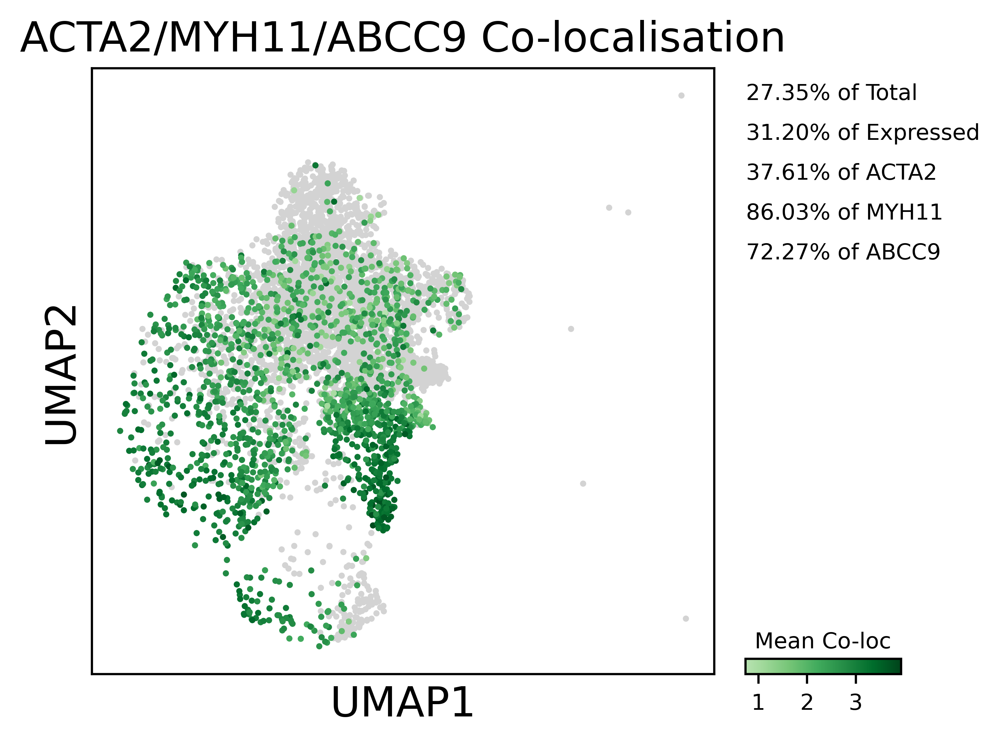

In [22]:
gene_coloc_2(adata,mode="plot",Gene1="ACTA2",Gene2="MYH11",Gene3="ABCC9",threshold=0.1,plot_only_coloc=True, color3 = "Greens", size = 5)

In [23]:
def gene_coloc(adata,Gene1="INHBA",Gene2="NRG1",threshold=0.1,mode=("plot","table"),color1="Reds",color2="Greens",color3="Blues",alpha=1,size=0.3,fontsize=8,label_width="25%",label_height="2.5%"):
    import warnings
    warnings.filterwarnings("ignore")
    def plot_coloc():
        df=pd.DataFrame(adata.obsm["X_umap"],columns=["x","y"],index=adata.obs.index)
        df["x1"]=df["x"]
        df["y1"]=df["y"]
        df["x2"]=df["x"]
        df["y2"]=df["y"]
        df["x3"]=df["x"]
        df["y3"]=df["y"]
        df["x4"]=df["x"]
        df["y4"]=df["y"]
        matrix["Gene1"]=matrix[Gene1]
        matrix["Gene2"]=matrix[Gene2]
        coloc=(matrix["Gene1"]+matrix["Gene2"])/2
        df.x1[matrix.Gene1<threshold]="NA"
        df.y1[matrix.Gene1<threshold]="NA"
        df.x1[matrix.Gene2>=threshold]="NA"
        df.y1[matrix.Gene2>=threshold]="NA"
        df.x2[matrix.Gene2<threshold]="NA"
        df.y2[matrix.Gene2<threshold]="NA"
        df.x2[matrix.Gene1>=threshold]="NA"
        df.y2[matrix.Gene1>=threshold]="NA"
        df.x3[matrix.Gene1>=threshold]="NA"
        df.y3[matrix.Gene1>=threshold]="NA"
        df.x3[matrix.Gene2>=threshold]="NA"
        df.y3[matrix.Gene2>=threshold]="NA"
        df.x4[matrix.Gene1<threshold]="NA"
        df.y4[matrix.Gene1<threshold]="NA"
        df.x4[matrix.Gene2<threshold]="NA"
        df.y4[matrix.Gene2<threshold]="NA"
        df.x1=df.x1.replace("NA",np.NaN)
        df.y1=df.y1.replace("NA",np.NaN)
        df.x2=df.x2.replace("NA",np.NaN)
        df.y2=df.y2.replace("NA",np.NaN)
        df.x3=df.x3.replace("NA",np.NaN)
        df.y3=df.y3.replace("NA",np.NaN)
        df.x4=df.x4.replace("NA",np.NaN)
        df.y4=df.y4.replace("NA",np.NaN)
        per=df.x4.count()/(df.x1.count()+df.x2.count()+df.x4.count())
        per=per*100
        c1Big = cm.get_cmap(color1, 512)
        c1 = ListedColormap(c1Big(np.linspace(0.3, 1.0, 256)))
        c2Big = cm.get_cmap(color2, 512)
        c2 = ListedColormap(c2Big(np.linspace(0.3, 1.0, 256)))
        c3Big = cm.get_cmap(color3, 512)
        c3 = ListedColormap(c3Big(np.linspace(0.3, 1.0, 256)))
        fig, ax = plt.subplots()

        plt.xlabel("UMAP1")
        plt.ylabel("UMAP2")
        plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False,labelleft=False)
        ax.scatter(df.x3,df.y3,s=size,c="whitesmoke",alpha=1,marker="o",edgecolors="none")
        ax.set_title("%.2f" % per +"%" + " Co-localisation")
        im=ax.scatter(df.x1,df.y1,s=size,c=matrix[Gene1],cmap=c1,alpha=alpha,marker="o",edgecolors="none")
        im2=ax.scatter(df.x2,df.y2,s=size,c=matrix[Gene2],cmap=c2,alpha=alpha,marker="o",edgecolors="none")
        im3=ax.scatter(df.x4,df.y4,s=size,c=coloc,cmap=c3,alpha=alpha,marker="o",edgecolors="none")
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        axins = inset_axes(ax,
                       width=label_width,  # width = 5% of parent_bbox width
                       height=label_height,  # height : 50%
                       loc='lower left',
                       bbox_to_anchor=(1.05, 0, 1, 1),
                       bbox_transform=ax.transAxes,
                       borderpad=0,
                       )
        axins2 = inset_axes(ax,
                       width=label_width,  # width = 5% of parent_bbox width
                       height=label_height,  # height : 50%
                       loc='lower left',
                       bbox_to_anchor=(1.05, 0.15, 1, 1),
                       bbox_transform=ax.transAxes,
                       borderpad=0,
                       )
        axins3 = inset_axes(ax,
                       width=label_width,  # width = 5% of parent_bbox width
                       height=label_height,  # height : 50%
                       loc='lower left',
                       bbox_to_anchor=(1.05, 0.3, 1, 1),
                       bbox_transform=ax.transAxes,
                       borderpad=0,
                       )
        cb1=fig.colorbar(im, cax=axins,orientation='horizontal',shrink=0.3)
        cb2=fig.colorbar(im2, cax=axins2,orientation='horizontal',shrink=0.3)
        cb3=fig.colorbar(im3, cax=axins3,orientation='horizontal',shrink=0.3)
        cb1.ax.set_title(label=Gene1,y=0.6,fontsize=fontsize)
        cb2.ax.set_title(label=Gene2,y=0.6,fontsize=fontsize)
        cb3.ax.set_title(label="Mean Co-loc",y=0.6,fontsize=fontsize)
        cb1.ax.tick_params(labelsize=fontsize)
        cb2.ax.tick_params(labelsize=fontsize)
        cb3.ax.tick_params(labelsize=fontsize)
        del matrix["Gene1"]
        del matrix["Gene2"]
    def coloc_table(adata=adata,Gene1=Gene1,Gene2=Gene2,threshold=threshold):
            df=pd.DataFrame(adata.obsm["X_umap"],columns=["x","y"],index=adata.obs.index)
            df["x1"]=df["x"]
            df["x2"]=df["x"]
            df["x3"]=df["x"]
            df["x4"]=df["x"]
            matrix["Gene1"]=matrix[Gene1]
            matrix["Gene2"]=matrix[Gene2]
            coloc=(matrix["Gene1"]+matrix["Gene2"])/2
            df.x1[matrix.Gene1<threshold]="NA"
            df.x1[matrix.Gene2>=threshold]="NA"
            df.x2[matrix.Gene2<threshold]="NA"
            df.x2[matrix.Gene1>=threshold]="NA"
            df.x4[matrix.Gene1<threshold]="NA"
            df.x4[matrix.Gene2<threshold]="NA"
            df.x1=df.x1.replace("NA",np.NaN)
            df.x2=df.x2.replace("NA",np.NaN)
            df.x4=df.x4.replace("NA",np.NaN)
            per=df.x4.count()/(df.x1.count()+df.x2.count()+df.x4.count())
            per=per*100
            name=Gene1+"_"+Gene2
            data={"Genes":name,"Percentage":per}
            del matrix["Gene1"]
            del matrix["Gene2"]
            return data
        
        
        
    if mode=="table":
        d = pd.DataFrame()
        for i,j in [(i,j) for i in Gene1 for j in Gene2]:
            if i==j:
                d=d
            else:
                x = coloc_table(Gene1=i,Gene2=j)
                ans=pd.DataFrame({"Genes":[x["Genes"]],"Coloc_Percent":[x["Percentage"]]})
                d=pd.concat([d,ans])
        return d
    
    if mode=="plot":
        plot_coloc()
    

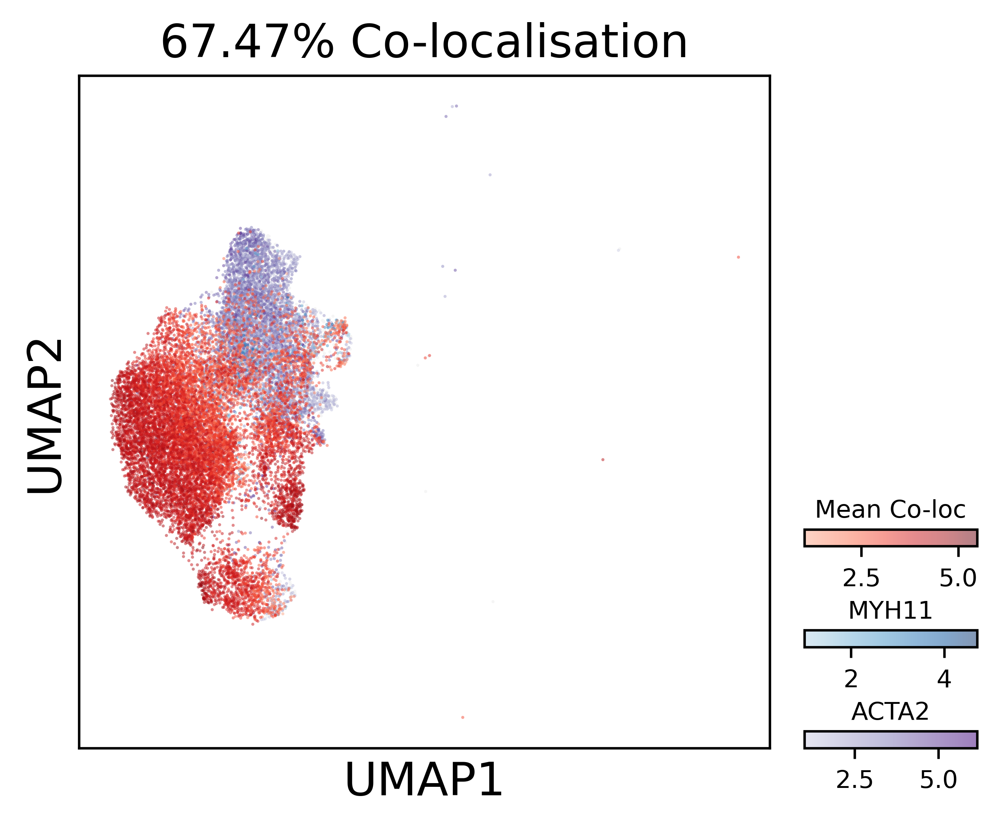

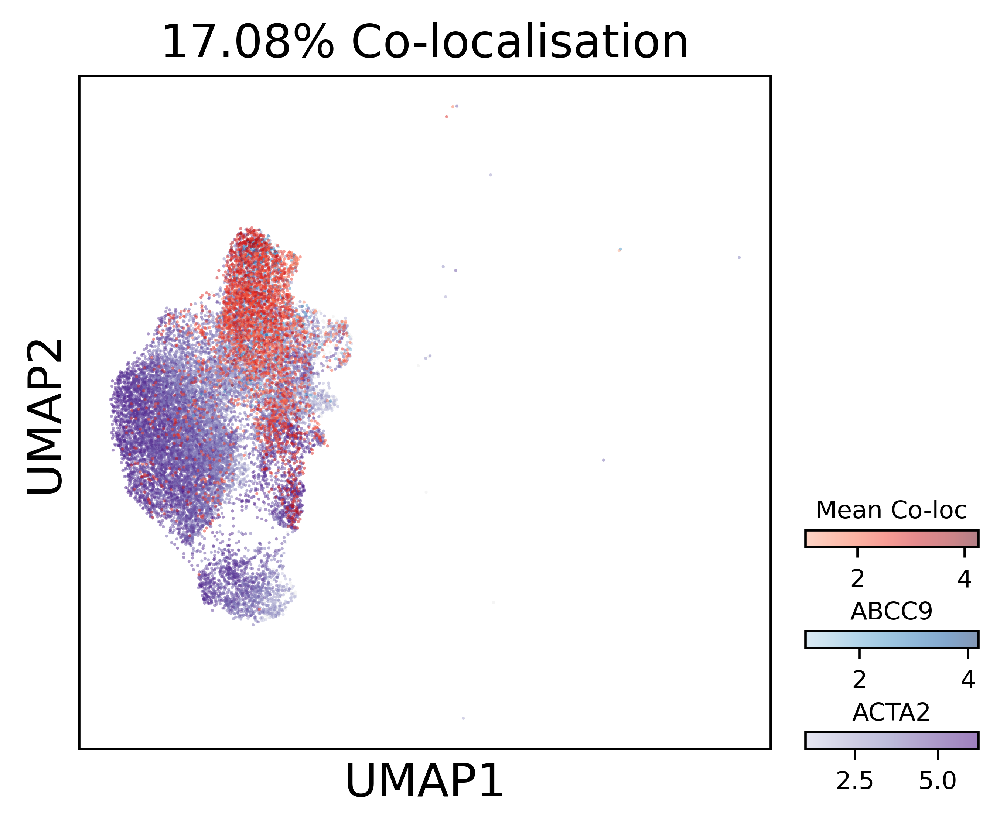

In [25]:
gene_coloc(adata,mode="plot",Gene1="ACTA2",Gene2="MYH11",size=1,threshold=1,color1="Purples",color2="Blues",color3="Reds",alpha=0.5)
gene_coloc(adata,mode="plot",Gene1="ACTA2",Gene2="ABCC9",size=1,threshold=1,color1="Purples",color2="Blues",color3="Reds",alpha=0.5)
